# Import Needed Modules

In [ ]:
!pip install -q segmentation-models-pytorch
! pip install -q albumentations

import os
import time
from glob import glob
from tqdm import tqdm

import cv2
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import albumentations as A
from scipy.ndimage.morphology import binary_dilation
import segmentation_models_pytorch as smp
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
<ipython-input-1-791f0695c78e>:15: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_dilation


#### Set TPU

In [ ]:
import tensorflow as tf

# 1. Resolves the TPU cluster
resolver = tf.distribute.cluster_resolver.TPUClusterResolver()

# 2. Connects to the TPU cluster
tf.config.experimental_connect_to_cluster(resolver)

# 3. Initializes the TPU system
tf.tpu.experimental.initialize_tpu_system(resolver)

# 4. Defines a strategy to distribute computations across TPU cores
strategy = tf.distribute.TPUStrategy(resolver)

ValueError: Please provide a TPU Name to connect to.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Data Preprocessing

#### Get all files

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
files_dir = '/content/drive/MyDrive/Cloud Computing/Preliminary_Dataset'
file_paths = glob(f'{files_dir}/*/*[0-9].tif')

In [ ]:
csv_path = '/content/drive/MyDrive/Cloud Computing/Preliminary_Dataset/data.csv'
df = pd.read_csv(csv_path)

#### Read csv file of data

In [ ]:
df = pd.read_csv(csv_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Patient                    20 non-null     object
 1   RNASeqCluster              20 non-null     int64 
 2   MethylationCluster         20 non-null     int64 
 3   miRNACluster               20 non-null     int64 
 4   CNCluster                  20 non-null     int64 
 5   RPPACluster                20 non-null     int64 
 6   OncosignCluster            20 non-null     int64 
 7   COCCluster                 20 non-null     int64 
 8   histological_type          20 non-null     int64 
 9   neoplasm_histologic_grade  20 non-null     int64 
 10  tumor_tissue_site          20 non-null     int64 
 11  laterality                 20 non-null     int64 
 12  tumor_location             20 non-null     int64 
 13  gender                     20 non-null     int64 
 14  age_at_initi

#### Missing values handling

In [ ]:
imputer = SimpleImputer(strategy="most_frequent")

df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
df

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_6186,2,4,1,2,1,3,2,2,2,1,3,2,2,58,3,2,1
1,TCGA_CS_6188,2,4,3,2,3,3,2,1,2,1,3,6,2,48,3,2,0
2,TCGA_DU_5851,4,5,1,1,4,2,1,2,2,1,3,6,1,40,3,2,0
3,TCGA_DU_5852,2,4,4,2,2,3,2,2,2,1,1,6,1,61,3,2,1
4,TCGA_DU_5853,1,5,2,1,1,2,1,2,1,1,1,2,2,29,3,2,0
5,TCGA_DU_5854,2,4,1,2,3,3,2,1,2,1,3,2,1,57,3,2,0
6,TCGA_DU_5855,1,3,4,1,3,2,1,2,2,1,3,2,1,49,3,2,0
7,TCGA_EZ_7264,3,3,2,3,2,1,3,3,1,1,3,2,1,47,3,2,0
8,TCGA_FG_7643,4,4,1,2,4,1,2,2,1,1,3,2,1,49,3,2,0
9,TCGA_FG_8189,4,1,2,1,4,1,1,3,1,1,3,6,1,33,3,2,0


#### Function to get data

In [ ]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)
    filename = os.path.basename(path)

    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists of 3 first filename segments

    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [ ]:
# Show sample
get_file_row('/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif')

['TCGA_DU_7010',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif']

#### Store the data into a dataframe

In [ ]:
filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
filenames_df

,Patient,image_filename,mask_filename
0,TCGA_DU_5851,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
1,TCGA_DU_5851,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
2,TCGA_DU_5851,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
3,TCGA_DU_5851,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
4,TCGA_DU_5851,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
...,...,...,...
691,TCGA_HT_7881,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
692,TCGA_HT_7881,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
693,TCGA_HT_7881,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...
694,TCGA_HT_7881,/content/drive/MyDrive/Cloud Computing/Prelimi...,/content/drive/MyDrive/Cloud Computing/Prelimi...


## Dataset Class

In [ ]:
class MriDataset(Dataset):
    def __init__(self, df, transform=None, mean=0.5, std=0.25):
        super(MriDataset, self).__init__()
        self.df = df
        self.transform = transform
        self.mean = mean
        self.std = std


    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx, raw=False):
        row = self.df.iloc[idx]
        img = cv2.imread(row['image_filename'], cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(row['mask_filename'], cv2.IMREAD_GRAYSCALE)
        if raw:
            return img, mask

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        img = T.functional.to_tensor(img)
        mask = mask // 255
        mask = torch.Tensor(mask)
        return img, mask

In [ ]:
df = pd.merge(df, filenames_df, on="Patient")

### Split data into train, valid, and test

In [ ]:
train_df, test_df = train_test_split(df, test_size=0.3)
test_df, valid_df = train_test_split(test_df, test_size=0.5)

### Transforming
- Only applied channel dropout and random color changes, the model gave subpar results when confronted with rotations and flips.

In [ ]:
transform = A.Compose([
    A.ChannelDropout(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
])

train_dataset = MriDataset(train_df, transform)
valid_dataset = MriDataset(valid_df)
test_dataset = MriDataset(test_df)

### DataLoaders

In [ ]:
batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

#### Show sample

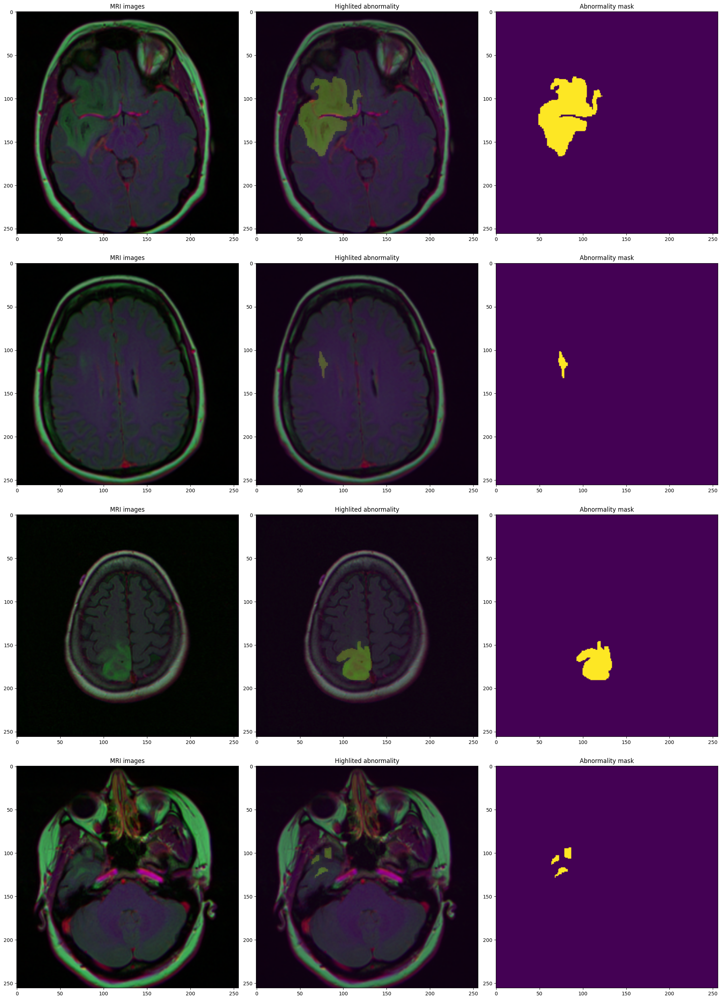

In [ ]:
%matplotlib inline
n_examples = 4

fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
i = 0
for ax in axs:
    while True:
        image, mask = train_dataset.__getitem__(i, raw=True)
        i += 1
        if np.any(mask):
            ax[0].set_title("MRI images")
            ax[0].imshow(image)
            ax[1].set_title("Highlited abnormality")
            ax[1].imshow(image)
            ax[1].imshow(mask, alpha=0.2)
            ax[2].imshow(mask)
            ax[2].set_title("Abnormality mask")
            break




# Model Structure

### Create EarlyStopping class

In [ ]:
class EarlyStopping():
    """
    Stops training when loss stops decreasing in a PyTorch module.
    """
    def __init__(self, patience:int = 6, min_delta: float = 0, weights_path: str = 'weights.pt'):
        """
        :param patience: number of epochs of non-decreasing loss before stopping
        :param min_delta: minimum difference between best and new loss that is considered
            an improvement
        :paran weights_path: Path to the file that should store the model's weights
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.weights_path = weights_path

    def __call__(self, val_loss: float, model: torch.nn.Module):
        if self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.weights_path)
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

    def load_weights(self, model: torch.nn.Module):
        """
        Loads weights of the best model.
        :param model: model to which the weigths should be loaded
        """
        return model.load_state_dict(torch.load(self.weights_path))


### Create metrics

In [ ]:
def iou_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Intersection over Union for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()

    intersection = (predictions & labels).float().sum((1, 2))
    union = (predictions | labels).float().sum((1, 2))

    iou = (intersection + e) / (union + e)
    return iou

def dice_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Dice coefficient for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()

    intersection = (predictions & labels).float().sum((1, 2))
    return ((2 * intersection) + e) / (predictions.float().sum((1, 2)) + labels.float().sum((1, 2)) + e)

### Loss function

In [ ]:
def BCE_dice(output, target, alpha=0.01):
    bce = torch.nn.functional.binary_cross_entropy(output, target)
    soft_dice = 1 - dice_pytorch(output, target).mean()
    return bce + alpha * soft_dice

### UNet Model with EfficientNetB7 as a backbone

In [ ]:
model = smp.Unet(
    encoder_name="efficientnet-b7",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation='sigmoid',
)
model.to(device);

# Training

In [ ]:
def training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler):
    history = {'train_loss': [], 'val_loss': [], 'val_IoU': [], 'val_dice': []}
    early_stopping = EarlyStopping(patience=7)

    for epoch in range(1, epochs + 1):
        start_time = time.time()

        running_loss = 0
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            predictions = model(img)
            predictions = predictions.squeeze(1)
            loss = loss_fn(predictions, mask)
            running_loss += loss.item() * img.size(0)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        model.eval()
        with torch.no_grad():
            running_IoU = 0
            running_dice = 0
            running_valid_loss = 0
            for i, data in enumerate(valid_loader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                running_dice += dice_pytorch(predictions, mask).sum().item()
                running_IoU += iou_pytorch(predictions, mask).sum().item()
                loss = loss_fn(predictions, mask)
                running_valid_loss += loss.item() * img.size(0)
        train_loss = running_loss / len(train_loader.dataset)
        val_loss = running_valid_loss / len(valid_loader.dataset)
        val_dice = running_dice / len(valid_loader.dataset)
        val_IoU = running_IoU / len(valid_loader.dataset)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_IoU'].append(val_IoU)
        history['val_dice'].append(val_dice)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss} | Validation Mean IoU: {val_IoU} '
         f'| Validation Dice coefficient: {val_dice}')

        lr_scheduler.step(val_loss)
        if early_stopping(val_loss, model):
            early_stopping.load_weights(model)
            break
    model.eval()
    return history

In [ ]:
loss_fn = BCE_dice
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 15
lr_scheduler = ReduceLROnPlateau(optimizer=optimizer, patience=2,factor=0.2)

history = training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler)

100%|██████████| 31/31 [07:48<00:00, 15.11s/it]


Epoch: 1/15 | Training loss: 0.32466303935041174 | Validation loss: 0.25355666478474936 | Validation Mean IoU: 0.5548757598513648 | Validation Dice coefficient: 0.6007277261643182


100%|██████████| 31/31 [02:53<00:00,  5.61s/it]


Epoch: 2/15 | Training loss: 0.0774802677333355 | Validation loss: 0.0909681876145658 | Validation Mean IoU: 0.5806500389462426 | Validation Dice coefficient: 0.5880187443324498


100%|██████████| 31/31 [02:58<00:00,  5.76s/it]


Epoch: 3/15 | Training loss: 0.03931315574466081 | Validation loss: 0.049650724906296954 | Validation Mean IoU: 0.6744212559291295 | Validation Dice coefficient: 0.6981838862101237


100%|██████████| 31/31 [03:01<00:00,  5.86s/it]


Epoch: 4/15 | Training loss: 0.02482246505421657 | Validation loss: 0.04490800006758599 | Validation Mean IoU: 0.6767407826014927 | Validation Dice coefficient: 0.6955331802368164


100%|██████████| 31/31 [03:02<00:00,  5.87s/it]


Epoch: 5/15 | Training loss: 0.018156270923004994 | Validation loss: 0.030133448612122308 | Validation Mean IoU: 0.743668692452567 | Validation Dice coefficient: 0.7746511686415899


100%|██████████| 31/31 [02:57<00:00,  5.72s/it]


Epoch: 6/15 | Training loss: 0.015073131678101953 | Validation loss: 0.016998120725509665 | Validation Mean IoU: 0.8084051586332776 | Validation Dice coefficient: 0.8408333324250721


100%|██████████| 31/31 [03:00<00:00,  5.82s/it]


Epoch: 7/15 | Training loss: 0.01161818888451468 | Validation loss: 0.020038047965083804 | Validation Mean IoU: 0.7842775026957194 | Validation Dice coefficient: 0.8190602983747209


100%|██████████| 31/31 [02:57<00:00,  5.74s/it]


Epoch: 8/15 | Training loss: 0.009483940604867631 | Validation loss: 0.011162023077763263 | Validation Mean IoU: 0.8469142005557105 | Validation Dice coefficient: 0.8772221065702892


100%|██████████| 31/31 [03:01<00:00,  5.86s/it]


Epoch: 9/15 | Training loss: 0.007925561437999076 | Validation loss: 0.013860129068295162 | Validation Mean IoU: 0.8191637674967448 | Validation Dice coefficient: 0.8513805752708798


100%|██████████| 31/31 [02:59<00:00,  5.78s/it]


Epoch: 10/15 | Training loss: 0.006931169312332568 | Validation loss: 0.009574333214688868 | Validation Mean IoU: 0.8529067720685687 | Validation Dice coefficient: 0.8824078832353864


100%|██████████| 31/31 [02:52<00:00,  5.56s/it]


Epoch: 11/15 | Training loss: 0.0064191303275204295 | Validation loss: 0.013999698985190618 | Validation Mean IoU: 0.7876098178681873 | Validation Dice coefficient: 0.8249388195219494


100%|██████████| 31/31 [02:55<00:00,  5.67s/it]


Epoch: 12/15 | Training loss: 0.00601450619679824 | Validation loss: 0.008654141772006239 | Validation Mean IoU: 0.8779780069986979 | Validation Dice coefficient: 0.9090905870710101


100%|██████████| 31/31 [02:58<00:00,  5.77s/it]


Epoch: 13/15 | Training loss: 0.00597193387759662 | Validation loss: 0.011179783656483604 | Validation Mean IoU: 0.8525848207019624 | Validation Dice coefficient: 0.8871592022123791


100%|██████████| 31/31 [02:53<00:00,  5.59s/it]


Epoch: 14/15 | Training loss: 0.006615914851886047 | Validation loss: 0.012190057789640767 | Validation Mean IoU: 0.8485571043831962 | Validation Dice coefficient: 0.8828839619954427


100%|██████████| 31/31 [02:51<00:00,  5.53s/it]


Epoch: 15/15 | Training loss: 0.006546183896597161 | Validation loss: 0.011531166838748115 | Validation Mean IoU: 0.708204242161342 | Validation Dice coefficient: 0.7419918287368048


### Evaluation

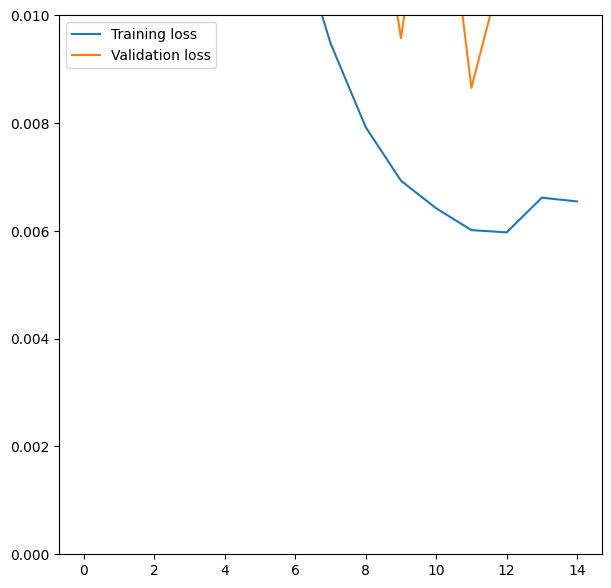

In [ ]:
plt.figure(figsize=(7, 7))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0, 0.01)
plt.legend()
plt.show()

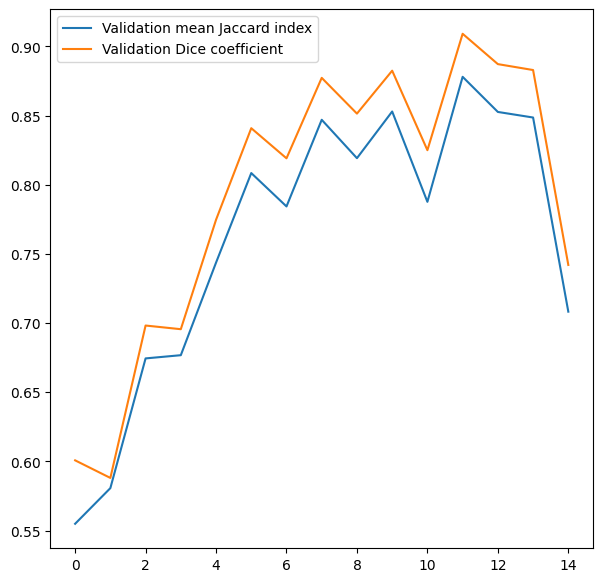

In [ ]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.legend()
plt.show()

## Test Evaluation

In [ ]:
with torch.no_grad():
    running_IoU = 0
    running_dice = 0
    running_loss = 0
    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        running_dice += dice_pytorch(predictions, mask).sum().item()
        running_IoU += iou_pytorch(predictions, mask).sum().item()
        loss = loss_fn(predictions, mask)
        running_loss += loss.item() * img.size(0)
    loss = running_loss / len(test_dataset)
    dice = running_dice / len(test_dataset)
    IoU = running_IoU / len(test_dataset)

    print(f'Tests: loss: {loss} | Mean IoU: {IoU} | Dice coefficient: {dice}')

Tests: loss: 0.013084379360617068 | Mean IoU: 0.709871035245947 | Dice coefficient: 0.7446928000268718


# Testing

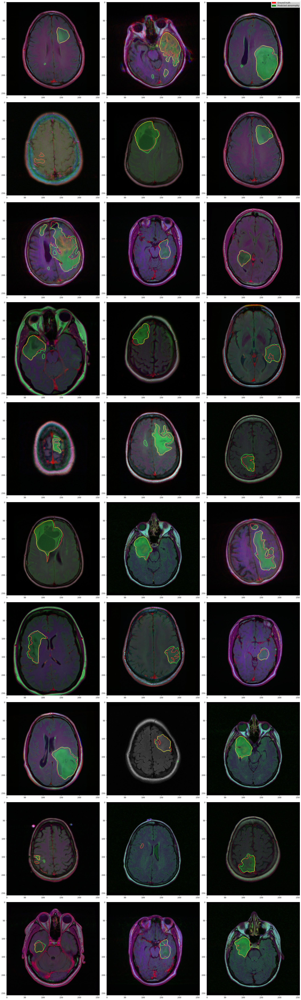

In [ ]:
%matplotlib inline

width = 3
columns = 10
n_examples = columns * width

fig, axs = plt.subplots(columns, width, figsize=(7*width , 7*columns), constrained_layout=True)
red_patch = mpatches.Patch(color='red', label='The red data')
fig.legend(loc='upper right',handles=[
    mpatches.Patch(color='red', label='Ground truth'),
    mpatches.Patch(color='green', label='Predicted abnormality')])
i = 0
with torch.no_grad():
    for data in test_loader:
        image, mask = data
        mask = mask[0]
        if not mask.byte().any():
            continue
        image = image.to(device)
        prediction = model(image).to('cpu')[0][0]
        prediction = torch.where(prediction > 0.5, 1, 0)
        prediction_edges = prediction - binary_dilation(prediction)
        ground_truth = mask - binary_dilation(mask)
        image[0, 0, ground_truth.bool()] = 1
        image[0, 1, prediction_edges.bool()] = 1

        axs[i//width][i%width].imshow(image[0].to('cpu').permute(1, 2, 0))
        if n_examples == i + 1:
            break
        i += 1


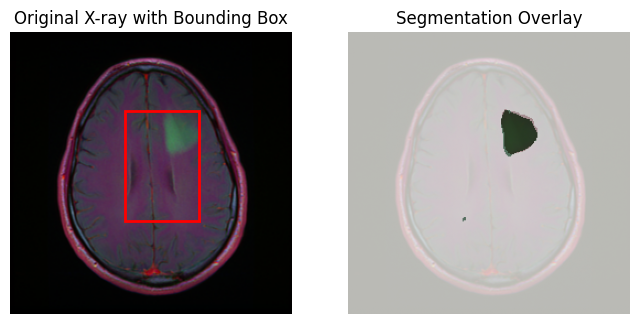

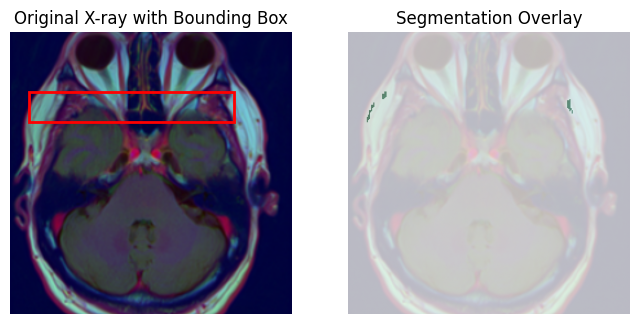

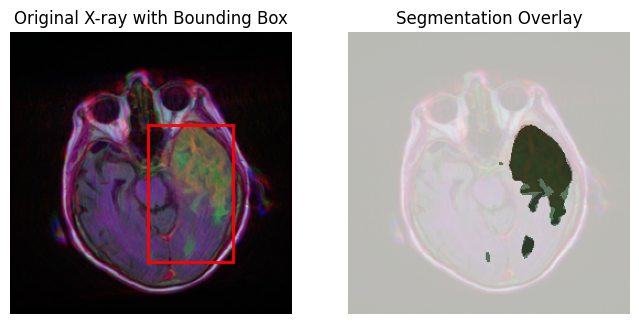

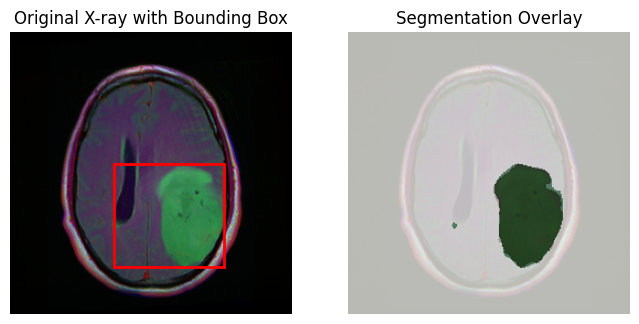

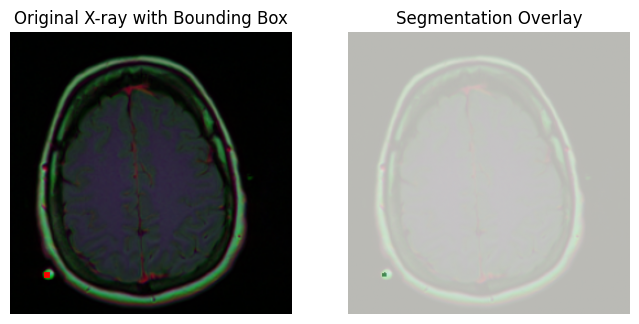

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import binary_dilation

def visualize_segmentation_with_bounding_boxes(
    model,
    test_loader,
    device,
    max_images=5
):
    """
    1) Perform image segmentation using a U-Net model.
    2) Display the original X-ray with predicted segmentation overlay and bounding boxes.
    """
    model.eval()

    with torch.no_grad():
        count = 0
        for images, masks in test_loader:
            if count >= max_images:
                break

            images, masks = images.to(device), masks.to(device)
            predictions = model(images).to('cpu')
            predictions = predictions.squeeze(1) > 0.5  # Threshold segmentation mask

            for i in range(len(images)):
                if count >= max_images:
                    break

                image = images[i].cpu().permute(1, 2, 0).numpy()
                mask = masks[i].cpu().numpy()
                pred = predictions[i].cpu().numpy()

                # Compute bounding boxes for the predicted segmentation mask
                ys, xs = np.where(pred)
                if ys.size == 0 or xs.size == 0:
                    continue  # Skip if no predicted region

                y_min, y_max = ys.min(), ys.max()
                x_min, x_max = xs.min(), xs.max()
                # Plot the results
                fig, axes = plt.subplots(1, 2, figsize=(8, 4))

                # --- Left: Original X-ray with bounding box
                axes[0].imshow(image, cmap="gray")
                rect = patches.Rectangle(
                    (x_min, y_min),
                    x_max - x_min,
                    y_max - y_min,
                    linewidth=2,
                    edgecolor="red",
                    facecolor="none"
                )
                axes[0].add_patch(rect)
                axes[0].axis("off")
                axes[0].set_title("Original X-ray with Bounding Box")

                # --- Right: Segmentation overlay
                axes[1].imshow(image, cmap="gray")
                axes[1].imshow(mask, cmap="Reds", alpha=0.5, label="Ground Truth")
                axes[1].imshow(pred, cmap="Greens", alpha=0.5, label="Predicted Segmentation")
                axes[1].axis("off")
                axes[1].set_title("Segmentation Overlay")

                plt.show()
                count += 1

# Call the function to visualize segmentation results
visualize_segmentation_with_bounding_boxes(
    model=model,
    test_loader=test_loader,
    device=device,
    max_images=5
)

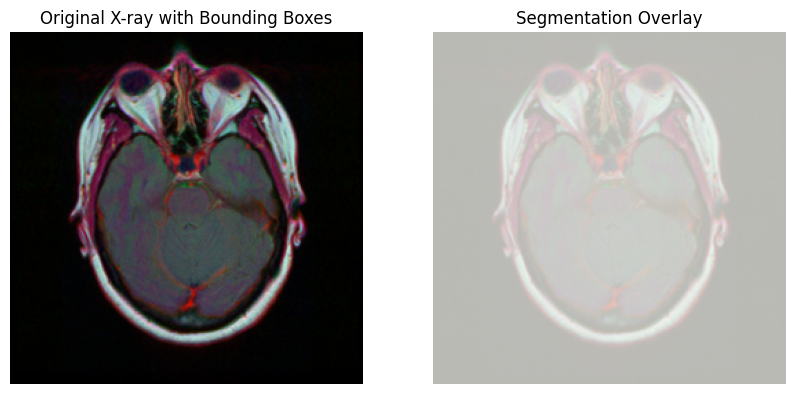

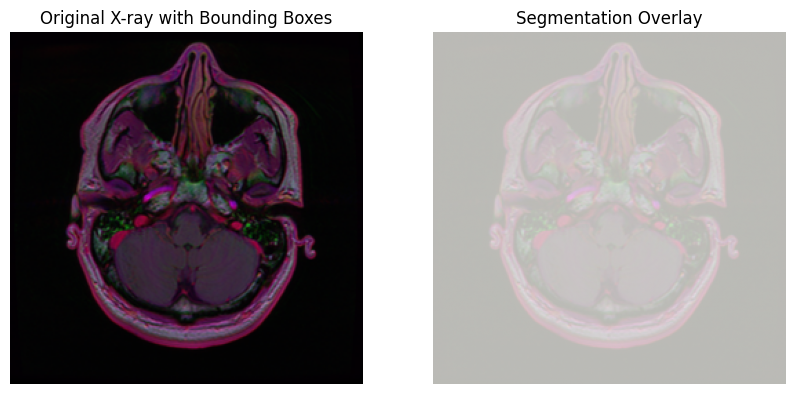

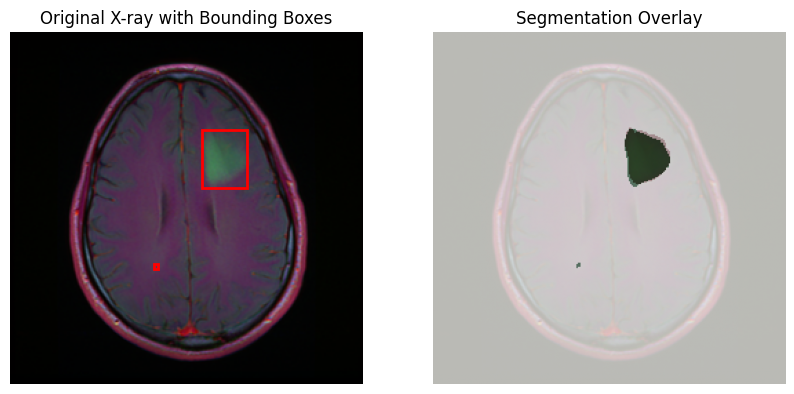

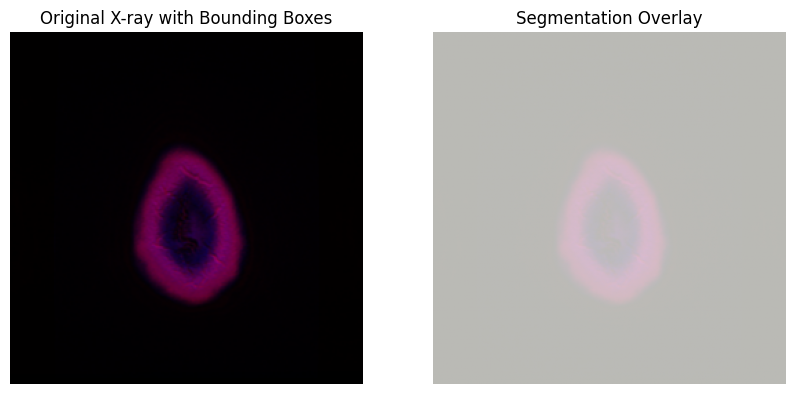

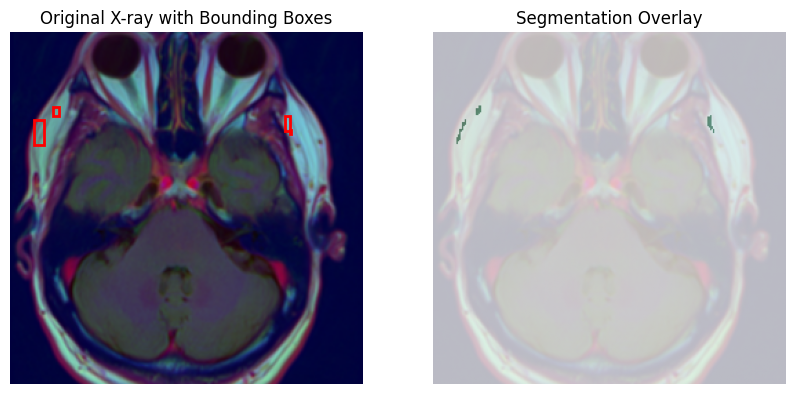

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import label, find_objects  # Import for connected component analysis

def visualize_segmentation_with_bounding_boxes(
    model,
    test_loader,
    device,
    max_images=5
):
    """
    1) Perform image segmentation using a U-Net model.
    2) Display the original X-ray with predicted segmentation overlay and bounding boxes.
    3) Draws multiple bounding boxes if there are multiple identified pathological parts.
    """
    model.eval()

    with torch.no_grad():
        count = 0
        for images, masks in test_loader:
            if count >= max_images:
                break

            images, masks = images.to(device), masks.to(device)
            predictions = model(images).to('cpu')
            predictions = predictions.squeeze(1) > 0.5  # Threshold segmentation mask

            for i in range(len(images)):
                if count >= max_images:
                    break

                image = images[i].cpu().permute(1, 2, 0).numpy()
                mask = masks[i].cpu().numpy()
                pred = predictions[i].cpu().numpy()

                # --- Connected Component Analysis to find multiple regions ---
                labeled_array, num_features = label(pred)  # Label connected regions
                # Get bounding boxes for each labeled region
                objects = find_objects(labeled_array)

                # --- Plotting ---
                fig, axes = plt.subplots(1, 2, figsize=(10, 6))

                # --- Left: Original X-ray with bounding boxes ---
                axes[0].imshow(image, cmap="gray")
                for obj in objects:
                    if obj is not None:  # Check if region exists
                        y_min, y_max = obj[0].start, obj[0].stop
                        x_min, x_max = obj[1].start, obj[1].stop

                        rect = patches.Rectangle(
                            (x_min, y_min),
                            x_max - x_min,
                            y_max - y_min,
                            linewidth=2,
                            edgecolor="red",
                            facecolor="none"
                        )
                        axes[0].add_patch(rect)
                axes[0].axis("off")
                axes[0].set_title("Original X-ray with Bounding Boxes")

                # --- Right: Segmentation overlay ---
                axes[1].imshow(image, cmap="gray")
                axes[1].imshow(mask, cmap="Reds", alpha=0.5, label="Ground Truth")
                axes[1].imshow(pred, cmap="Greens", alpha=0.5, label="Predicted Segmentation")
                axes[1].axis("off")
                axes[1].set_title("Segmentation Overlay")

                plt.show()
                count += 1

# Call the function to visualize segmentation results
visualize_segmentation_with_bounding_boxes(
    model=model,
    test_loader=test_loader,
    device=device,
    max_images=5
)